In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np

from sklearn.metrics import confusion_matrix

In [13]:
model_output_dir = '/media/ssd1/huong/PCR-huong/data/model_outputs/'
test_pred = pd.read_csv(os.path.join(model_output_dir, 'experimental', 'seq_gene_test_pred_df.csv'))

### vary model threshold

In [46]:
model_dict = {'fnr':[], 'fpr':[], 'pos_frac':[]}
for i in np.arange(0,1,0.001):
    test_pred['pred'] = 1*(test_pred.outputs >= i)
    tn, fp, fn, tp = confusion_matrix(test_pred.groundtruth_label, test_pred.pred, labels=np.array([0,1])).ravel()
    
    model_dict['fnr'].append(fn/(fn+tp))
    model_dict['fpr'].append(fp/(fp+tn))
    model_dict['pos_frac'].append((tp+fp)/(tp+fp+tn+fn))
    
model_dict_df = pd.DataFrame(model_dict)
    

In [47]:
model_dict_df.pos_frac.quantile([0,0.5,1])

0.0    0.834170
0.5    0.902834
1.0    1.000000
Name: pos_frac, dtype: float64

In [42]:
model_dict_df.head()

,fnr,fpr,pos_frac
0,1.00000,0.000000,0.000000
1,1.00000,0.298555,0.030121
2,0.99982,0.349920,0.035466
3,0.99964,0.436597,0.044372
4,0.99964,0.529695,0.053765


In [15]:
curve_df = pd.read_hdf('/media/ssd1/huong/PCR-huong/data/data.h5', key='curve_data')
sample_info = pd.read_hdf('/media/ssd1/huong/PCR-huong/data/data.h5', key='sample_info')
igi_gene_call = pd.read_hdf('/media/ssd1/huong/PCR-huong/data/data.h5', key='igi_gene_call')

join_df = (curve_df
           .merge(sample_info, how='inner', on=['well_position','pcr_plate'])
           .merge(igi_gene_call, how ='inner', on=['pcr_plate','sample_id','target']))

join_df['test_kit'] = join_df.groupby('sample_id').curve_idx.transform(lambda x: x.nunique())
join_df['test_kit'] = np.where(join_df.test_kit == 3, 'Thermo', 'LuNER')
join_df.head()

,well_position,target,dye,amp_score,cq,threshold,baseline_start,baseline_end,cycle_no,rn,...,final_patient_result,current_sample_result,created_date,record_type,retest_sample_id_1,retest_sample_id_2,file,igi_call,thres_ct,test_kit
0,A1,S gene,ABY,0.0,Undetermined,8810.498,3,39,1,147103.828125,...,Negative,Negative,44205,Pooled Sample,,,db1i,Negative,Undetermined,LuNER
1,A1,S gene,ABY,0.0,Undetermined,8810.498,3,39,2,146864.656250,...,Negative,Negative,44205,Pooled Sample,,,db1i,Negative,Undetermined,LuNER
2,A1,S gene,ABY,0.0,Undetermined,8810.498,3,39,3,146410.109375,...,Negative,Negative,44205,Pooled Sample,,,db1i,Negative,Undetermined,LuNER
3,A1,S gene,ABY,0.0,Undetermined,8810.498,3,39,4,146188.328125,...,Negative,Negative,44205,Pooled Sample,,,db1i,Negative,Undetermined,LuNER
4,A1,S gene,ABY,0.0,Undetermined,8810.498,3,39,5,146078.421875,...,Negative,Negative,44205,Pooled Sample,,,db1i,Negative,Undetermined,LuNER


In [32]:
full_test_pred = (test_pred
                  .merge(join_df[['curve_idx','threshold','target','pcr_plate','test_kit','thres_ct','cycle_no','drn','igi_call']],
                         on = 'curve_idx'))
full_test_pred['encoded_igi_call'] = 1*(full_test_pred.igi_call == 'Positive')
print(full_test_pred.shape)

(270020, 13)


In [33]:
thres_ct_df = full_test_pred.loc[full_test_pred.thres_ct != 'Undetermined', ['curve_idx','thres_ct']].drop_duplicates()
thres_ct_df['cycle_no'] = thres_ct_df.thres_ct.apply(lambda x: np.around(float(x)))

new_thres_df = (full_test_pred[['pcr_plate','target','curve_idx','cycle_no','drn']]
                  .merge(thres_ct_df, on=['curve_idx','cycle_no']))
new_thres_df['igi_threshold'] = new_thres_df.groupby(['pcr_plate','target']).drn.transform('mean')

full_test_pred = (full_test_pred
                  .merge(new_thres_df[['curve_idx','igi_threshold']], on =['curve_idx'], how='left')
                  )


full_test_pred.loc[full_test_pred.igi_threshold.isna(),'igi_threshold'] = full_test_pred.loc[full_test_pred.igi_threshold.isna(),'threshold']
print(full_test_pred.shape)
full_test_pred.head(5)

(270020, 14)


,curve_idx,groundtruth_label,outputs,pred,threshold,target,pcr_plate,test_kit,thres_ct,cycle_no,drn,igi_call,encoded_igi_call,igi_threshold
0,28389,0.0,0.196824,True,10000.0,RnaseP,AC00DB4P,Thermo,Undetermined,1,395.486492,Negative,0,10000.0
1,28389,0.0,0.196824,True,10000.0,RnaseP,AC00DB4P,Thermo,Undetermined,2,419.455004,Negative,0,10000.0
2,28389,0.0,0.196824,True,10000.0,RnaseP,AC00DB4P,Thermo,Undetermined,3,363.302422,Negative,0,10000.0
3,28389,0.0,0.196824,True,10000.0,RnaseP,AC00DB4P,Thermo,Undetermined,4,89.227964,Negative,0,10000.0
4,28389,0.0,0.196824,True,10000.0,RnaseP,AC00DB4P,Thermo,Undetermined,5,95.155460,Negative,0,10000.0


In [18]:
plate_target_pair = full_test_pred[['pcr_plate','target','test_kit']].drop_duplicates()

In [19]:
cycle_range_dict = {'LuNER':{'other': np.arange(35,46),
                            #  'E gene': np.concatenate([np.arange(35,40), np.arange(41,46)]),
                             'RnaseP': np.arange(30,41)},
                    'Thermo': np.arange(30,41)}
                    
fn_range = np.arange(-0.5, 0.5, 0.05)

In [20]:
threshold_dict = {'pcr_plate':[],
                  'target':[],
                  'igi_fp':[],
                  'igi_fn':[],
                  'best_fp':[],
                  'best_fn':[],
                  'best_fp_pos_frac':[],
                  'best_fn_pos_frac':[],
                  'best_fp_perc':[],
                  'best_fp_cycle':[],
                  'best_fn_perc':[],
                  'best_fn_cycle':[],
                  'worst_fp':[],
                  'worst_fn':[],
                  'worst_fn_pos_frac':[],
                  'worst_fp_pos_frac':[],
                  'worst_fp_perc':[],
                  'worst_fp_cycle':[],
                  'worst_fn_perc':[],
                  'worst_fn_cycle':[],
                  }

for plate in plate_target_pair.pcr_plate.unique():
    for target in plate_target_pair[plate_target_pair.pcr_plate == plate].target:
        
        temp_thresholds = {'perc':[], 'cycle':[], 'pos_frac':[], 'fnr':[],  'fpr':[]}
        df = full_test_pred[(full_test_pred.target == target) & (full_test_pred.pcr_plate == plate)]
        
        for perc in fn_range:
            df['new_threshold'] = df['igi_threshold'] * (1 + perc)
            df['if_pass'] = df.drn >= df.new_threshold
            df['new_ct'] = np.Inf
            pass_curve_idx = df[df.if_pass].curve_idx.unique()
            df.loc[df.curve_idx.isin(pass_curve_idx), 'new_ct'] = df[df.curve_idx.isin(pass_curve_idx)].groupby(['curve_idx']).cycle_no.transform('min')
    
            df['new_encoded_igi_call'] = 0
            for cycle in range(10):
                df.loc[(df.test_kit == 'Thermo') & (df.new_ct <= cycle_range_dict['Thermo'][cycle]), 'new_encoded_igi_call'] = 1
                # RnaseP
                df.loc[(df.target == 'RnaseP') & (df.new_ct <= cycle_range_dict['LuNER']['RnaseP'][cycle]), 'new_encoded_igi_call'] = 1
                # other
                df.loc[(df.test_kit == 'LuNER') & (df.target != 'RnaseP') & (df.new_ct <= cycle_range_dict['LuNER']['other'][cycle]), 'new_encoded_igi_call'] = 1
                
                tn, fp, fn, tp = confusion_matrix(df.groundtruth_label, df.new_encoded_igi_call, labels = np.array([0,1])).ravel()
        
                temp_thresholds['perc'].append(perc)
                temp_thresholds['cycle'].append(cycle)
                temp_thresholds['pos_frac'].append((fp+tp)/(fp+tp+fn+tn))
                temp_thresholds['fnr'].append(fn/(fn+tp))
                # temp_thresholds['tnr'].append(tn/(tn+fp))
                temp_thresholds['fpr'].append(fp/(fp+tn))
                # temp_thresholds['tpr'].append(tp/(tp+fn))
        
        igi_tn, igi_fp, igi_fn, igi_tp = confusion_matrix(df.groundtruth_label, df.encoded_igi_call, labels = np.array([0,1])).ravel()
        threshold_dict['pcr_plate'].append(plate)
        threshold_dict['target'].append(target)
        threshold_dict['igi_fp'].append(igi_fp/(igi_fp + igi_tn))
        threshold_dict['igi_fn'].append(igi_fn/(igi_tp + igi_fn))
        
        threshold_dict['best_fp'].append(min(temp_thresholds['fpr']))
        best_fp_idx = np.array(temp_thresholds['fpr']).argmin()
        threshold_dict['best_fp_pos_frac'].append(temp_thresholds['pos_frac'][best_fp_idx])
        threshold_dict['best_fp_perc'].append(temp_thresholds['perc'][best_fp_idx])
        threshold_dict['best_fp_cycle'].append(temp_thresholds['cycle'][best_fp_idx])
        
        threshold_dict['best_fn'].append(min(temp_thresholds['fnr']))
        best_fn_idx = np.array(temp_thresholds['fnr']).argmin()
        threshold_dict['best_fn_pos_frac'].append(temp_thresholds['pos_frac'][best_fn_idx])
        threshold_dict['best_fn_perc'].append(temp_thresholds['perc'][best_fn_idx])
        threshold_dict['best_fn_cycle'].append(temp_thresholds['cycle'][best_fn_idx])
        
        worst_fp_idx = np.array(temp_thresholds['fpr']).argmax()
        threshold_dict['worst_fp'].append(max(temp_thresholds['fpr']))
        threshold_dict['worst_fp_pos_frac'].append(temp_thresholds['pos_frac'][worst_fp_idx])
        threshold_dict['worst_fp_perc'].append(temp_thresholds['perc'][worst_fp_idx])
        threshold_dict['worst_fp_cycle'].append(temp_thresholds['cycle'][worst_fp_idx])
        
        worst_fn_idx = np.array(temp_thresholds['fnr']).argmax()
        threshold_dict['worst_fn'].append(max(temp_thresholds['fnr']))
        threshold_dict['worst_fn_pos_frac'].append(temp_thresholds['pos_frac'][worst_fn_idx])
        threshold_dict['worst_fn_perc'].append(temp_thresholds['perc'][worst_fn_idx])
        threshold_dict['worst_fn_cycle'].append(temp_thresholds['cycle'][worst_fn_idx])
        
        
            

/tmp/ipykernel_1461240/2703465025.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['new_threshold'] = df['igi_threshold'] * (1 + perc)
/tmp/ipykernel_1461240/2703465025.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['if_pass'] = df.drn >= df.new_threshold
/tmp/ipykernel_1461240/2703465025.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

/tmp/ipykernel_1461240/2703465025.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['new_threshold'] = df['igi_threshold'] * (1 + perc)
/tmp/ipykernel_1461240/2703465025.py:31: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['if_pass'] = df.drn >= df.new_threshold
/tmp/ipykernel_1461240/2703465025.py:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

In [21]:
threshold_range_df = pd.DataFrame(threshold_dict)
threshold_range_df.head()

,pcr_plate,target,igi_fp,igi_fn,best_fp,best_fn,best_fp_pos_frac,best_fn_pos_frac,best_fp_perc,best_fp_cycle,best_fn_perc,best_fn_cycle,worst_fp,worst_fn,worst_fn_pos_frac,worst_fp_pos_frac,worst_fp_perc,worst_fp_cycle,worst_fn_perc,worst_fn_cycle
0,AC00DB4P,RnaseP,0.0,0.000000,0.000000,0.000000,0.978723,0.978723,-0.50,0,-0.5,0,0.000000,0.000000,0.978723,0.978723,-0.5,0,-0.5,0
1,AC00DB4P,E gene,0.0,NaN,0.750000,NaN,0.750000,1.000000,0.20,0,-0.5,0,1.000000,NaN,1.000000,1.000000,-0.5,0,-0.5,0
2,AC00DB4P,N gene,0.0,NaN,0.000000,NaN,0.000000,0.250000,0.25,0,-0.5,0,0.250000,NaN,0.250000,0.250000,-0.5,0,-0.5,0
3,AC00GY79,RnaseP,0.0,0.019231,0.000000,0.019231,0.910714,0.910714,-0.50,0,-0.5,0,0.000000,0.019231,0.910714,0.910714,-0.5,0,-0.5,0
4,AC00GY79,E gene,0.0,0.000000,0.333333,0.000000,0.500000,0.500000,-0.50,0,-0.5,0,0.333333,0.000000,0.500000,0.500000,-0.5,0,-0.5,0


In [22]:
new_full_test_pred = (full_test_pred
 .merge(threshold_range_df[['pcr_plate','target','best_fp_perc','best_fp_cycle','best_fn_perc',
                            'best_fn_cycle','worst_fp_perc','worst_fp_cycle','worst_fn_perc','worst_fn_cycle']],
        on=['pcr_plate','target']))
new_full_test_pred['best_fp_threshold'] = new_full_test_pred.igi_threshold * (1 + new_full_test_pred.best_fp_perc)
new_full_test_pred['best_fn_threshold'] = new_full_test_pred.igi_threshold * (1 + new_full_test_pred.best_fn_perc)
new_full_test_pred['worst_fp_threshold'] = new_full_test_pred.igi_threshold * (1 + new_full_test_pred.worst_fp_perc)
new_full_test_pred['worst_fn_threshold'] = new_full_test_pred.igi_threshold * (1 + new_full_test_pred.worst_fn_perc)



In [23]:
new_full_test_pred['best_fp_if_pass'] = new_full_test_pred.drn >= new_full_test_pred.best_fp_threshold
new_full_test_pred['best_fn_if_pass'] = new_full_test_pred.drn >= new_full_test_pred.best_fn_threshold
new_full_test_pred['worst_fp_if_pass'] = new_full_test_pred.drn >= new_full_test_pred.worst_fp_threshold
new_full_test_pred['worst_fn_if_pass'] = new_full_test_pred.drn >= new_full_test_pred.worst_fn_threshold

best_fp_pass_ids = new_full_test_pred[new_full_test_pred.best_fp_if_pass].curve_idx.unique()
best_fn_pass_ids = new_full_test_pred[new_full_test_pred.best_fn_if_pass].curve_idx.unique()
worst_fp_pass_ids = new_full_test_pred[new_full_test_pred.worst_fp_if_pass].curve_idx.unique()
worst_fn_pass_ids = new_full_test_pred[new_full_test_pred.worst_fn_if_pass].curve_idx.unique()

new_full_test_pred['best_fp_ct'] = np.Inf
new_full_test_pred['best_fn_ct'] = np.Inf
new_full_test_pred['worst_fp_ct'] = np.Inf
new_full_test_pred['worst_fn_ct'] = np.Inf

new_full_test_pred.loc[new_full_test_pred.curve_idx.isin(best_fp_pass_ids),'best_fp_ct'] = (new_full_test_pred[new_full_test_pred.curve_idx.isin(best_fp_pass_ids)]
                                                                                            .groupby('curve_idx').cycle_no.transform('min'))
new_full_test_pred.loc[new_full_test_pred.curve_idx.isin(best_fn_pass_ids),'best_fn_ct'] = (new_full_test_pred[new_full_test_pred.curve_idx.isin(best_fn_pass_ids)]
                                                                                            .groupby('curve_idx').cycle_no.transform('min'))
new_full_test_pred.loc[new_full_test_pred.curve_idx.isin(worst_fp_pass_ids),'worst_fp_ct'] = (new_full_test_pred[new_full_test_pred.curve_idx.isin(worst_fp_pass_ids)]
                                                                                            .groupby('curve_idx').cycle_no.transform('min'))
new_full_test_pred.loc[new_full_test_pred.curve_idx.isin(worst_fn_pass_ids),'worst_fn_ct'] = (new_full_test_pred[new_full_test_pred.curve_idx.isin(worst_fn_pass_ids)]
                                                                                            .groupby('curve_idx').cycle_no.transform('min'))

new_full_test_pred['best_fp_igi_call'] = 0
new_full_test_pred['best_fn_igi_call'] = 0
new_full_test_pred['worst_fp_igi_call'] = 0
new_full_test_pred['worst_fn_igi_call'] = 0

new_full_test_pred['actual_best_fp_cycle'] = new_full_test_pred['best_fp_cycle']
new_full_test_pred['actual_best_fn_cycle'] = new_full_test_pred['best_fn_cycle']
new_full_test_pred['actual_worst_fp_cycle'] = new_full_test_pred['worst_fp_cycle']
new_full_test_pred['actual_worst_fn_cycle'] = new_full_test_pred['worst_fn_cycle']

new_full_test_pred.loc[(new_full_test_pred.test_kit == 'Thermo'),'actual_best_fp_cycle'] = new_full_test_pred[(new_full_test_pred.test_kit == 'Thermo')].best_fp_cycle.apply(lambda x: cycle_range_dict['Thermo'][x])
new_full_test_pred.loc[(new_full_test_pred.test_kit == 'Thermo'),'actual_best_fn_cycle'] = new_full_test_pred[(new_full_test_pred.test_kit == 'Thermo')].best_fn_cycle.apply(lambda x: cycle_range_dict['Thermo'][x])
new_full_test_pred.loc[(new_full_test_pred.test_kit == 'Thermo'),'actual_worst_fp_cycle'] = new_full_test_pred[(new_full_test_pred.test_kit == 'Thermo')].worst_fp_cycle.apply(lambda x: cycle_range_dict['Thermo'][x])
new_full_test_pred.loc[(new_full_test_pred.test_kit == 'Thermo'),'actual_worst_fn_cycle'] = new_full_test_pred[(new_full_test_pred.test_kit == 'Thermo')].worst_fn_cycle.apply(lambda x: cycle_range_dict['Thermo'][x])

new_full_test_pred.loc[(new_full_test_pred.test_kit == 'LuNER') & (new_full_test_pred.target == 'RnaseP'),'actual_best_fp_cycle'] = new_full_test_pred[(new_full_test_pred.test_kit == 'LuNER')& (new_full_test_pred.target == 'RnaseP')].best_fp_cycle.apply(lambda x: cycle_range_dict['LuNER']['RnaseP'][x])
new_full_test_pred.loc[(new_full_test_pred.test_kit == 'LuNER') & (new_full_test_pred.target == 'RnaseP'),'actual_best_fn_cycle'] = new_full_test_pred[(new_full_test_pred.test_kit == 'LuNER')& (new_full_test_pred.target == 'RnaseP')].best_fn_cycle.apply(lambda x: cycle_range_dict['LuNER']['RnaseP'][x])
new_full_test_pred.loc[(new_full_test_pred.test_kit == 'LuNER') & (new_full_test_pred.target == 'RnaseP'),'actual_worst_fp_cycle'] = new_full_test_pred[(new_full_test_pred.test_kit == 'LuNER')& (new_full_test_pred.target == 'RnaseP')].worst_fp_cycle.apply(lambda x: cycle_range_dict['LuNER']['RnaseP'][x])
new_full_test_pred.loc[(new_full_test_pred.test_kit == 'LuNER') & (new_full_test_pred.target == 'RnaseP'),'actual_worst_fn_cycle'] = new_full_test_pred[(new_full_test_pred.test_kit == 'LuNER')& (new_full_test_pred.target == 'RnaseP')].worst_fn_cycle.apply(lambda x: cycle_range_dict['LuNER']['RnaseP'][x])

new_full_test_pred.loc[(new_full_test_pred.test_kit == 'LuNER') & (new_full_test_pred.target != 'RnaseP'),'actual_best_fp_cycle'] = new_full_test_pred[(new_full_test_pred.test_kit == 'LuNER')& (new_full_test_pred.target != 'RnaseP')].best_fp_cycle.apply(lambda x: cycle_range_dict['LuNER']['other'][x])
new_full_test_pred.loc[(new_full_test_pred.test_kit == 'LuNER') & (new_full_test_pred.target != 'RnaseP'),'actual_best_fn_cycle'] = new_full_test_pred[(new_full_test_pred.test_kit == 'LuNER')& (new_full_test_pred.target != 'RnaseP')].best_fn_cycle.apply(lambda x: cycle_range_dict['LuNER']['other'][x])
new_full_test_pred.loc[(new_full_test_pred.test_kit == 'LuNER') & (new_full_test_pred.target != 'RnaseP'),'actual_worst_fp_cycle'] = new_full_test_pred[(new_full_test_pred.test_kit == 'LuNER')& (new_full_test_pred.target != 'RnaseP')].worst_fp_cycle.apply(lambda x: cycle_range_dict['LuNER']['other'][x])
new_full_test_pred.loc[(new_full_test_pred.test_kit == 'LuNER') & (new_full_test_pred.target != 'RnaseP'),'actual_worst_fn_cycle'] = new_full_test_pred[(new_full_test_pred.test_kit == 'LuNER')& (new_full_test_pred.target != 'RnaseP')].worst_fn_cycle.apply(lambda x: cycle_range_dict['LuNER']['other'][x])

new_full_test_pred.loc[(new_full_test_pred.best_fp_ct <= new_full_test_pred.actual_best_fp_cycle),'best_fp_igi_call'] = 1
new_full_test_pred.loc[(new_full_test_pred.best_fn_ct <= new_full_test_pred.actual_best_fn_cycle),'best_fn_igi_call'] = 1
new_full_test_pred.loc[(new_full_test_pred.worst_fp_ct <= new_full_test_pred.actual_worst_fp_cycle),'worst_fp_igi_call'] = 1
new_full_test_pred.loc[(new_full_test_pred.worst_fn_ct <= new_full_test_pred.actual_worst_fn_cycle),'worst_fn_igi_call'] = 1


In [24]:
tn, fp, fn, tp = confusion_matrix(new_full_test_pred.groundtruth_label, new_full_test_pred.encoded_igi_call, labels=np.array([0,1])).ravel()
fp/(fp+tn)

0.0

In [25]:
best_fp_tn, best_fp_fp, best_fp_fn, best_fp_tp = confusion_matrix(new_full_test_pred.groundtruth_label, new_full_test_pred.best_fp_igi_call, labels=np.array([0,1])).ravel()
best_fp_fpr = best_fp_fp/(best_fp_fp+best_fp_tn)
best_fp_fnr = best_fp_fn/(best_fp_fn+best_fp_tp)
best_fpr_pos_frac = (best_fp_fp + best_fp_tp)/(best_fp_fp+best_fp_tp+best_fp_fn+best_fp_tn)

In [26]:
worst_fp_tn, worst_fp_fp, worst_fp_fn, worst_fp_tp = confusion_matrix(new_full_test_pred.groundtruth_label, new_full_test_pred.worst_fp_igi_call, labels=np.array([0,1])).ravel()
worst_fp_fpr = worst_fp_fp/(worst_fp_fp+worst_fp_tn) 
worst_fp_fnr = worst_fp_fn/(worst_fp_fn+worst_fp_tp) 
worst_fpr_pos_frac = (worst_fp_fp + worst_fp_tp)/(worst_fp_fp+worst_fp_tp+worst_fp_fn+worst_fp_tn)

In [90]:
igi_tn, igi_fp, igi_fn, igi_tp = confusion_matrix(new_full_test_pred.groundtruth_label, new_full_test_pred.encoded_igi_call, labels=np.array([0,1])).ravel()
igi_fnr = igi_fn/(igi_fn+igi_tp) 
igi_pos_frac = (igi_fp + igi_tp)/(igi_fp+igi_tp+igi_fn+igi_tn)
igi_fpr = igi_fp/(igi_fp + igi_tn)

In [28]:
best_fn_tn, best_fn_fp, best_fn_fn, best_fn_tp = confusion_matrix(new_full_test_pred.groundtruth_label, new_full_test_pred.best_fn_igi_call, labels=np.array([0,1])).ravel()
best_fn_fnr = best_fn_fn/(best_fn_fn+best_fn_tp)
best_fn_fpr = best_fn_fp/(best_fn_fp+best_fn_tn)
best_fnr_pos_frac = (best_fn_fp + best_fn_tp)/(best_fn_fp+best_fn_tp+best_fn_fn+best_fn_tn)

In [29]:
worst_fn_tn, worst_fn_fp, worst_fn_fn, worst_fn_tp = confusion_matrix(new_full_test_pred.groundtruth_label, new_full_test_pred.worst_fn_igi_call, labels=np.array([0,1])).ravel()
worst_fn_fnr = worst_fn_fn/(worst_fn_fn+worst_fn_tp)
worst_fn_fpr = worst_fn_fp/(worst_fn_fp+worst_fn_tn)
worst_fnr_pos_frac = (worst_fn_fp + worst_fn_tp)/(worst_fn_fp+worst_fn_tp+worst_fn_fn+worst_fn_tn)

In [34]:
thres_df = {'fpr':[], 'fnr':[], 'pos_pred': []}

for perc in fn_range:
    for cycle in range(10):
        df = full_test_pred.copy()
        df['new_threshold'] = full_test_pred.igi_threshold * (1 + perc)
        
        df['if_pass'] = df.drn >= df.new_threshold
        passed_ids = df[df.if_pass].curve_idx.unique()
        df['new_ct'] = np.Inf
        df.loc[df.curve_idx.isin(passed_ids), 'new_ct'] = df[df.curve_idx.isin(passed_ids)].groupby('curve_idx').cycle_no.transform('min')
        
        
        # if df.test_kit.iloc[0] == 'Thermo':
        df.loc[df.test_kit == 'Thermo','new_igi_call'] = 1*(df[df.test_kit == 'Thermo'].new_ct <= cycle_range_dict['Thermo'][cycle])
    
        df.loc[(df.test_kit == 'LuNER') & (df.target == 'RnaseP'), 'new_igi_call'] = 1*(df[(df.test_kit == 'LuNER') & (df.target == 'RnaseP')].new_ct <= cycle_range_dict['LuNER']['RnaseP'][cycle])
        df.loc[(df.test_kit == 'LuNER') & (df.target != 'RnaseP'), 'new_igi_call'] = 1*(df[(df.test_kit == 'LuNER') & (df.target != 'RnaseP')].new_ct <= cycle_range_dict['LuNER']['other'][cycle])
        
        tn, fp, fn, tp = confusion_matrix(df.groundtruth_label, df.new_igi_call, labels=np.array([0,1])).ravel()
        
        thres_df['fpr'].append(fp/(fp+tn))
        thres_df['fnr'].append(fn/(fn+tp))
        thres_df['pos_pred'].append((fp+tp)/(fp+tp+tn+fn))
        
        

In [38]:
random_df = {'tn':[], 'fp':[], 'fn':[], 'tp':[]}
choices_df = {'iteration':[], 'plate':[], 'target':[], 'perc':[], 'cycle':[]}
for i in range(500):
    total_tn, total_fp, total_fn, total_tp = 0,0,0,0
    np.random.seed(i)
    for plate in full_test_pred.pcr_plate.unique():
        plate_df = full_test_pred[full_test_pred.pcr_plate == plate].copy()
        for target in plate_df.target.unique():
            perc = np.random.choice(fn_range)
            cycle = np.random.choice(np.array(range(10)))
            choices_df['iteration'].append(i)
            choices_df['plate'].append(plate)
            choices_df['target'].append(target)
            choices_df['perc'].append(perc)
            
            df = plate_df[plate_df.target == target].copy()
            df['new_threshold'] = df.igi_threshold * (1 + perc)
            df['if_pass'] = df.drn >= df.new_threshold 
            passed_ids = df[df.if_pass].curve_idx.unique()
            
            df['new_ct'] = np.Inf
            df.loc[df.curve_idx.isin(passed_ids), 'new_ct'] = df[df.curve_idx.isin(passed_ids)].groupby('curve_idx').cycle_no.transform('min')
            
            if df.test_kit.iloc[0] == 'Thermo':
                df['new_igi_call'] = 1*(df.new_ct <= cycle_range_dict['Thermo'][cycle])
                choices_df['cycle'].append(cycle_range_dict['Thermo'][cycle])
            else:
                if target == 'RnaseP':
                    df['new_igi_call'] = 1*(df.new_ct <= cycle_range_dict['LuNER']['RnaseP'][cycle])
                    choices_df['cycle'].append(cycle_range_dict['LuNER']['RnaseP'][cycle])
                else:
                    df['new_igi_call'] = 1*(df.new_ct <= cycle_range_dict['LuNER']['other'][cycle])
                    choices_df['cycle'].append(cycle_range_dict['LuNER']['other'][cycle])
            
            tn, fp, fn, tp = confusion_matrix(df.groundtruth_label, df.new_igi_call, labels=np.array([0,1])).ravel()
            
            total_tn += tn
            total_fp += fp
            total_fn += fn
            total_tp += tp
            
    random_df['tn'].append(total_tn)
    random_df['fn'].append(total_fn)
    random_df['fp'].append(total_fp)
    random_df['tp'].append(total_tp)
            
            

In [39]:
random_500_df = pd.DataFrame(random_df)
random_500_df['fpr'] = random_500_df.fp/(random_500_df.fp + random_500_df.tn)
random_500_df['fnr'] = random_500_df.fn/(random_500_df.fn + random_500_df.tp)

random_500_df['pos_pred'] = (random_500_df.fp + random_500_df.tp)/(random_500_df.fn + random_500_df.fp + random_500_df.tn + random_500_df.tp)
random_500_df['fpr_type'] = 'simulated'
random_500_df['fnr_type'] = 'simulated'


In [49]:
final_thres_df = pd.DataFrame(thres_df)
final_thres_df['fpr_type'] = 'simulated'
final_thres_df['fnr_type'] = 'simulated'

final_thres_df = pd.concat([final_thres_df, 
                            pd.DataFrame({'fpr': [best_fp_fpr, best_fn_fpr, worst_fp_fpr, worst_fn_fpr],
                            'fnr': [best_fp_fnr, best_fn_fnr, worst_fp_fnr, worst_fn_fnr],
                            'pos_pred':[best_fpr_pos_frac, best_fnr_pos_frac, worst_fpr_pos_frac, worst_fnr_pos_frac],
                            'fpr_type':['best', 'simulated', 'worst', 'simulated'],
                            'fnr_type':['simulated','best','simulated','worst']
                            }),
                            random_500_df[['fpr','fnr','pos_pred','fpr_type','fnr_type']]
                            ])

Text(0.5, 1.0, 'FNR of IGI and model when varying thresholds')

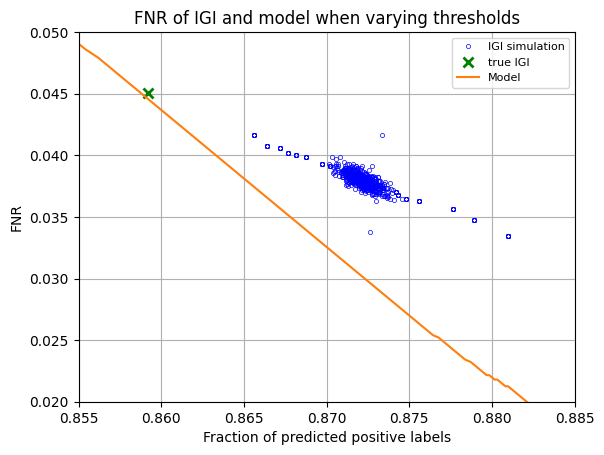

In [88]:

plt.plot(final_thres_df.pos_pred, 
         final_thres_df.fnr, 
         '.', **{'mfc': 'none', 'mec':'blue','mew':0.5}, label='IGI simulation')

plt.plot(igi_pos_frac, igi_fnr, 'x', color='green', **{'ms':7,'mew':2}, label='true IGI')

plt.plot(model_dict_df.pos_frac, model_dict_df.fnr, label='Model')
plt.xlim(0.855, 0.885)
plt.ylim(0.02,0.05)
plt.xlabel('Fraction of predicted positive labels')
plt.ylabel('FNR')
plt.legend(loc='upper right',fontsize=8)
plt.grid()
plt.title('FNR of IGI and model when varying thresholds')

Text(0.5, 1.0, 'FPR of IGI and model when varying thresholds')

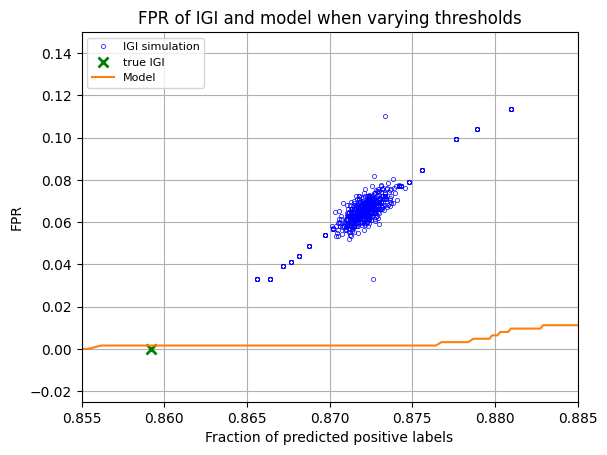

In [99]:

plt.plot(final_thres_df.pos_pred, 
         final_thres_df.fpr, 
         '.', **{'mfc': 'none', 'mec':'blue','mew':0.5}, label='IGI simulation')

plt.plot(igi_pos_frac, igi_fpr, 'x', color='green', **{'ms':7,'mew':2}, label='true IGI')

plt.plot(model_dict_df.pos_frac, model_dict_df.fpr, label='Model')
plt.xlim(0.855, 0.885)
plt.ylim(-0.025,0.15)
plt.xlabel('Fraction of predicted positive labels')
plt.ylabel('FPR')
plt.legend(loc='upper left',fontsize=8)
plt.grid()
plt.title('FPR of IGI and model when varying thresholds')

In [100]:
final_thres_df.to_csv('/media/ssd1/huong/PCR-huong/data/paper_plots_fin_thres_df.csv', index=False)

In [47]:
# get Fn threshold for each target, pcr_plate
igi_threshold_df = (full_test_pred.groupby(['pcr_plate','target']).threshold.max().reset_index())

cycle_range_dict = {'LuNER':{'other': np.arange(35,46),
                            #  'E gene': np.concatenate([np.arange(35,40), np.arange(41,46)]),
                             'RnaseP': np.arange(30,41)},
                    'Thermo': np.arange(30,41)}
                    
fn_range = np.arange(-0.3, 0.3, 0.1)


test_thresholds = {'perc':[], 'cycle':[], 'acc':[], 'fnr':[], 'tnr':[], 'fpr':[], 'tpr':[]}
df = full_test_pred.copy()

for perc in fn_range:
    df['new_threshold'] = df['threshold']*(1 + perc)
    df['if_pass'] = df.drn >= df.new_thresholda
    
    
    df['new_ct'] = 0
    df.loc[df.if_pass, 'new_ct'] = df[df.if_pass].groupby(['pcr_plate','target']).cycle_no.transform('min')
    
    df['new_encoded_igi_call'] = 0

    for cycle in range(10):
        
        df.loc[(df.test_kit == 'Thermo') & (df.new_ct >= cycle_range_dict['Thermo'][cycle]), 'new_encoded_igi_call'] = 1
        # RnaseP
        df.loc[(df.target == 'RnaseP') & (df.new_ct >= cycle_range_dict['LuNER']['RnaseP'][cycle]), 'new_encoded_igi_call'] = 1
        # other
        df.loc[(df.test_kit == 'LuNER') & (df.target != 'RnaseP') & (df.new_ct >= cycle_range_dict['LuNER']['other'][cycle]), 'new_encoded_igi_call'] = 1
        
        
        # igi_tn, igi_fp, igi_fn, igi_tp = confusion_matrix(fusion_vit_test_pred.groundtruth_label, fusion_vit_test_pred.encoded_igi_call).ravel()
        tn, fp, fn, tp = confusion_matrix(df.groundtruth_label, df.new_encoded_igi_call).ravel()
        
        test_thresholds['perc'].append(perc)
        test_thresholds['cycle'].append(cycle)
        test_thresholds['acc'].append((tn+tp)/(tn+tp+fn+fp))
        test_thresholds['fnr'].append(fn/(fn+tp))
        test_thresholds['tnr'].append(tn/(tn+fp))
        test_thresholds['fpr'].append(fp/(fp+tn))
        test_thresholds['tpr'].append(tp/(tp+fn))
        
        df['new_encoded_igi_call'] = 0
    
        
    df = full_test_pred.copy()
    